In [1]:
!pip install darts
!pip install utils
!pip install seaborn

     ---------------------------------------- 0.0/293.3 kB ? eta -:--:--
     ----- ------------------------------- 41.0/293.3 kB 653.6 kB/s eta 0:00:01
     --------------- ---------------------- 122.9/293.3 kB 1.2 MB/s eta 0:00:01
     ------------------------------ ------- 235.5/293.3 kB 1.8 MB/s eta 0:00:01
     -------------------------------------- 293.3/293.3 kB 1.8 MB/s eta 0:00:00


In [7]:
# # fix python path if working locally
# from utils import fix_pythonpath_if_working_locally

# fix_pythonpath_if_working_locally()

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import lag_plot
import shutil
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt

from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler
from darts.models import RNNModel, ExponentialSmoothing, BlockRNNModel
from darts.metrics import mape
from darts.utils.statistics import check_seasonality, plot_acf
from darts.datasets import AirPassengersDataset, SunspotsDataset
from darts.utils.timeseries_generation import datetime_attribute_timeseries

import warnings

warnings.filterwarnings("ignore")
import logging

logging.disable(logging.CRITICAL)

In [5]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
file_path = 'processed_dataset(3).csv'
data = pd.read_csv(file_path)

data = data.set_index('Date')
data.index = pd.to_datetime(data.index)

In [4]:
split_date = pd.to_datetime('2020-12-31 23:59')
data = data[data.index >= split_date]

In [5]:
# data['Temperature t+24'] = data['Temperature'].shift(periods=-24)
# data['Humidity t+24'] = data['Humidity'].shift(periods=-24)
data['Year'] = data.index.year
# data['Year t+24'] = data['Year'].shift(periods=-24)
data['Month'] = data.index.month

In [19]:
# Group by month and calculate the average
average_by_month = data.resample('M').mean()

# Print the result
print(average_by_month)

                    SIN  Temperature   Humidity    Year  Month
Date                                                          
2021-01-31  2326.212500    26.874735  71.201927  2021.0    1.0
2021-02-28  2367.799256    26.911612  59.211304  2021.0    2.0
2021-03-31  2329.732796    26.311939  60.412196  2021.0    3.0
2021-04-30  1956.759028    23.008477  62.884061  2021.0    4.0
2021-05-31  1714.600269    20.784653  59.301520  2021.0    5.0
2021-06-30  1753.256944    17.404957  67.280273  2021.0    6.0
2021-07-31  1748.828763    18.003732  45.492591  2021.0    7.0
2021-08-31  1828.254570    21.423062  46.385667  2021.0    8.0
2021-09-30  2069.589583    26.135214  45.830402  2021.0    9.0
2021-10-31  2026.715054    23.948858  64.928647  2021.0   10.0
2021-11-30  2344.638889    25.647907  62.376146  2021.0   11.0
2021-12-31  2745.415860    29.289352  41.716281  2021.0   12.0
2022-01-31  3012.284677    31.358740  41.125389  2022.0    1.0
2022-02-28  2829.584226    29.133575  46.837396  2022.0

In [15]:
print(data[data['Temperature'] > 50])

                        SIN  Temperature  Humidity  Year  Month
Date                                                           
2021-05-05 05:00:00  1850.0        100.0     100.0  2021      5
2021-05-05 06:00:00  1850.0        100.0     100.0  2021      5
2021-05-05 07:00:00  1932.0        100.0     100.0  2021      5
2021-05-05 08:00:00  1968.0        100.0     100.0  2021      5
2021-05-05 09:00:00  2057.0        100.0     100.0  2021      5
2021-05-05 10:00:00  2123.0        100.0     100.0  2021      5
2021-05-05 11:00:00  1952.0        100.0     100.0  2021      5
2021-05-05 12:00:00  1847.0        100.0     100.0  2021      5
2021-10-23 21:00:00  1880.0        100.0     100.0  2021     10
2021-10-23 22:00:00  1719.0        100.0     100.0  2021     10
2021-10-30 09:00:00  2227.0        100.0     100.0  2021     10
2022-03-11 00:00:00  2249.0        100.0     100.0  2022      3
2022-03-11 01:00:00  2195.0        100.0     100.0  2022      3
2022-04-22 09:00:00  2390.0        100.0

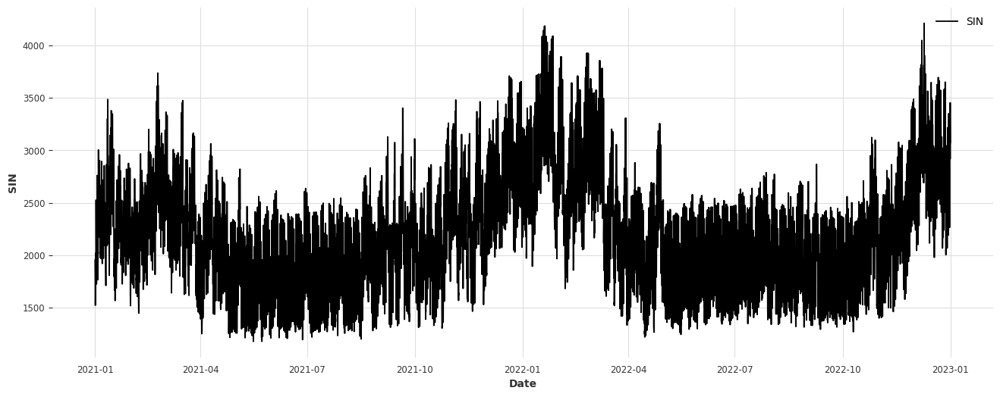

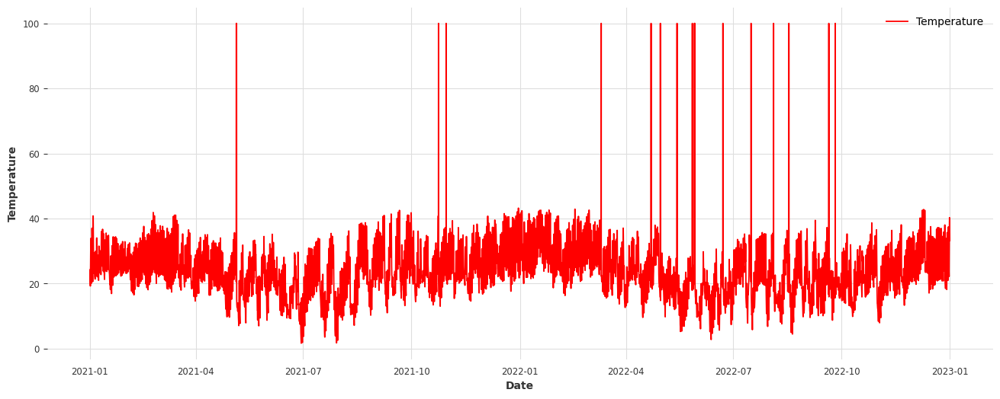

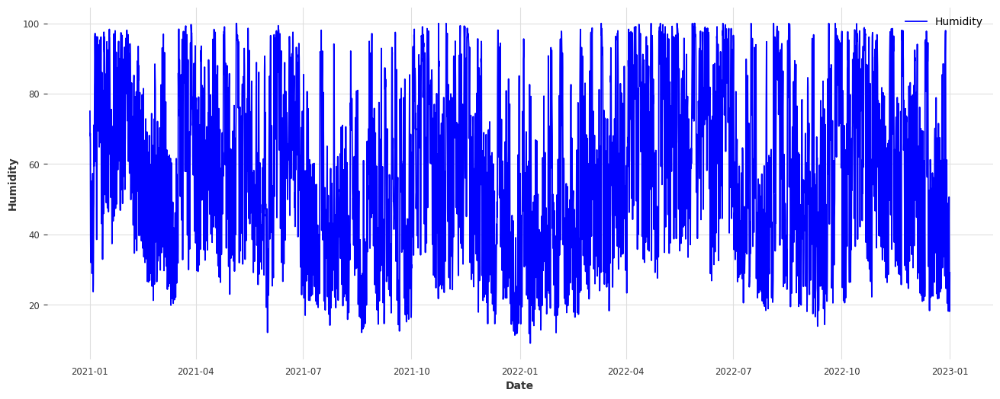

In [6]:
plt.figure(figsize=(16, 6))
plt.plot(data['SIN'], label = 'SIN')
plt.xlabel('Date')
plt.ylabel('SIN')
plt.legend(loc='upper right')
plt.grid(True)

plt.figure(figsize=(16, 6))
plt.plot(data['Temperature'], label = 'Temperature', color = 'red')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend(loc='upper right')
plt.grid(True)

plt.figure(figsize=(16, 6))
plt.plot(data['Humidity'], label = 'Humidity', color = 'blue')
plt.xlabel('Date')
plt.ylabel('Humidity')
plt.legend(loc='upper right')
plt.grid(True)

plt.show()

In [7]:
summary_stats = data.describe()
print(summary_stats)

                SIN   Temperature      Humidity          Year         Month
count  17520.000000  17520.000000  17520.000000  17520.000000  17520.000000
mean    2167.076100     23.657573     58.086979   2021.500000      6.526027
std      547.687833      8.339916     22.204461      0.500014      3.447950
min     1176.000000      1.655901      9.070926   2021.000000      1.000000
25%     1767.000000     18.600932     40.218092   2021.000000      4.000000
50%     2079.000000     23.141939     56.745453   2021.500000      7.000000
75%     2489.000000     28.500854     75.810916   2022.000000     10.000000
max     4212.000000    100.000000    100.000000   2022.000000     12.000000


<function matplotlib.pyplot.show(close=None, block=None)>

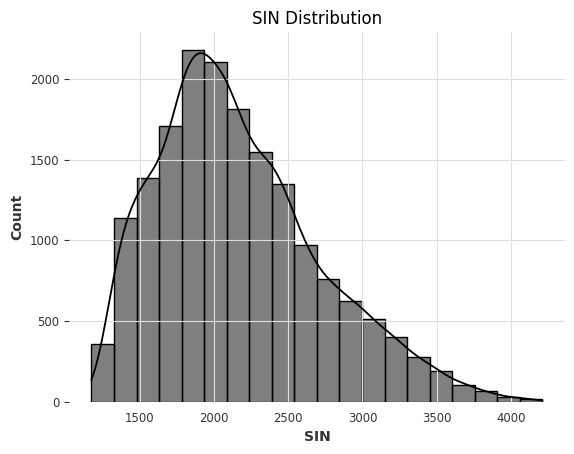

In [8]:
sns.histplot(data['SIN'], bins = 20, kde = True)
plt.xlabel('SIN')
plt.title('SIN Distribution')
plt.show

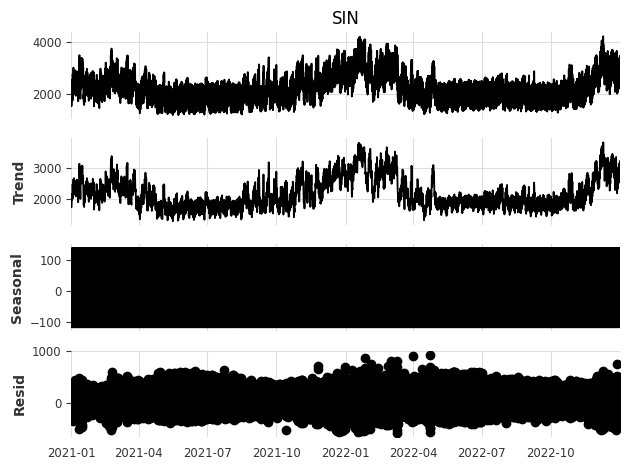

In [10]:
decomposition = seasonal_decompose(data['SIN'], model = 'additive', period = 12)
decomposition.plot()
plt.show()

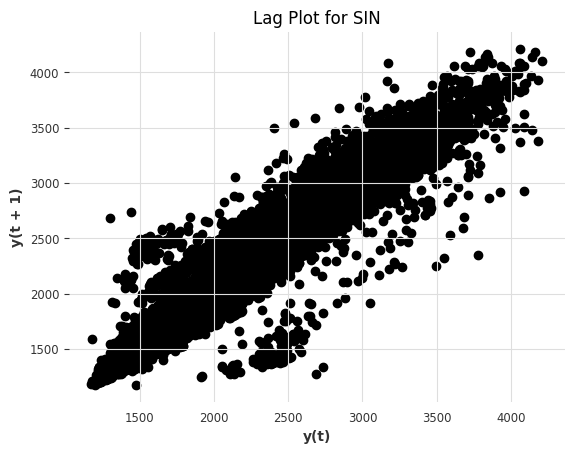

In [11]:
lag_plot(data['SIN'])
plt.title('Lag Plot for SIN')
plt.show()

In [15]:
data_sin = data[['SIN']]
data_cov = data[['Temperature', 'Humidity', 'Year', 'Month']]

In [16]:
series = TimeSeries.from_dataframe(data_sin, value_cols=["SIN"])
covariates = TimeSeries.from_dataframe(data_cov, value_cols=["Temperature", "Humidity", "Year", "Month"])
series = series.astype(np.float32)
covariates = covariates.astype(np.float32)

In [20]:
# # Create training and validation sets:
training_cutoff = pd.Timestamp("20211231T230000")
train, val = series.split_after(training_cutoff)

In [21]:
print(train)

<TimeSeries (DataArray) (Date: 8760, component: 1, sample: 1)>
array([[[1954.]],

       [[1909.]],

       [[1866.]],

       ...,

       [[3216.]],

       [[2854.]],

       [[2725.]]], dtype=float32)
Coordinates:
  * Date       (Date) datetime64[ns] 2021-01-01 ... 2021-12-31T23:00:00
  * component  (component) object 'SIN'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None


In [22]:
print(val)

<TimeSeries (DataArray) (Date: 8760, component: 1, sample: 1)>
array([[[2680.]],

       [[2651.]],

       [[2596.]],

       ...,

       [[3454.]],

       [[3120.]],

       [[2922.]]], dtype=float32)
Coordinates:
  * Date       (Date) datetime64[ns] 2022-01-01 ... 2022-12-31T23:00:00
  * component  (component) object 'SIN'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None


In [23]:
# Normalize the time series (note: we avoid fitting the transformer on the validation set)
transformer = Scaler()
train_transformed = transformer.fit_transform(train)
val_transformed = transformer.transform(val)
series_transformed = transformer.transform(series)

In [24]:
covariates = covariates.stack(
    TimeSeries.from_times_and_values(
        times=series.time_index,
        values=np.arange(len(series)),
        columns=["linear_increase"],
    )
)
covariates = covariates.astype(np.float32)
cov_train, cov_val = covariates.split_after(training_cutoff)

In [25]:
# transform covariates (note: we fit the transformer on train split and can then transform the entire covariates series)
scaler_covs = Scaler()
cov_train, cov_val = covariates.split_after(training_cutoff)
scaler_covs.fit(cov_train)
covariates_transformed = scaler_covs.transform(covariates)

In [36]:
my_model = RNNModel(
    model="LSTM",
    hidden_dim=20,
    dropout=0,
    batch_size=48,
    n_epochs=50,
    optimizer_kwargs={"lr": 1e-3},
    model_name="LSTM_Load",
    log_tensorboard=True,
    random_state=42,
    # training_length=672,
    input_chunk_length=36,
    force_reset=True,
    save_checkpoints=True,
)

In [37]:
my_model.fit(
    train_transformed,
    future_covariates=covariates,
    val_series=val_transformed,
    val_future_covariates=covariates,
    verbose=True,
)

Epoch 0: 100%|████████████████████████████████████████| 182/182 [00:10<00:00, 16.96it/s, v_num=logs, train_loss=0.0463]
Validation: 0it [00:00, ?it/s]
Epoch 1: 100%|███████████████████████| 182/182 [00:12<00:00, 14.61it/s, v_num=logs, train_loss=0.0355, val_loss=0.0629]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|███████████████████████| 182/182 [00:10<00:00, 17.58it/s, v_num=logs, train_loss=0.0321, val_loss=0.0626]
Validation: 0it [00:00, ?it/s]
Epoch 3: 100%|████████████████████████| 182/182 [00:10<00:00, 18.05it/s, v_num=logs, train_loss=0.0339, val_loss=0.063]
Validation: 0it [00:00, ?it/s]
Epoch 4: 100%|███████████████████████| 182/182 [00:09<00:00, 18.84it/s, v_num=logs, train_loss=0.0319, val_loss=0.0622]
Validation: 0it [00:00, ?it/s]
Epoch 5: 100%|███████████████████████| 182/182 [00:10<00:00, 18.12it/s, v_num=logs, train_loss=0.0301, val_loss=0.0619]
Validation: 0it [00:00, ?it/s]
Epoch 6: 100%|███████████████████████| 182/182 [00:11<00:00, 16.54it/s, v_num=logs, train_loss

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Epoch 30: 100%|███████████████████████| 182/182 [00:10<00:00, 17.88it/s, v_num=logs, train_loss=0.0295, val_loss=0.060]
Validation: 0it [00:00, ?it/s]
Epoch 31: 100%|███████████████████████| 182/182 [00:09<00:00, 19.41it/s, v_num=logs, train_loss=0.0183, val_loss=0.069]
Validation: 0it [00:00, ?it/s]
Epoch 36: 100%|██████████████████████| 182/182 [00:09<00:00, 19.34it/s, v_num=logs, train_loss=0.0228, val_loss=0.0761]
Validation: 0it [00:00, ?it/s]
Epoch 37: 100%|██████████████████████| 182/182 [00:09<00:00, 18.45it/s, v_num=logs, train_loss=0.0276, val_loss=0.0578]
Validation: 0it [00:00, ?it/s]
Epoch 38: 100%|███████████████████████| 182/182 [00:10<00:00, 18.02it/s, v_num=logs, train_loss=0.022, val_loss=0.0546]
Validation: 0it [00:00, ?it/s]
Epoch 39: 100%|██████████████████████| 182/182 [00:09<00:00, 19.17it/s, v_num=logs, train_loss=0.0202, val_loss=0.0598]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   2%|▉                                                        | 3/182

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Predicting DataLoader 0: 100%|███████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 46.69it/s]


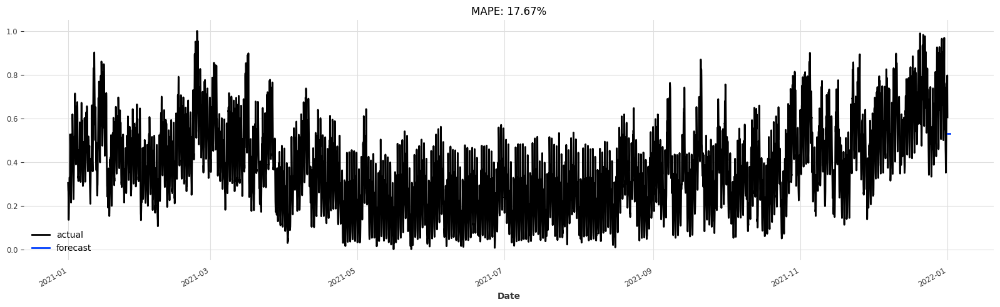

In [39]:
def eval_model(model):
    pred_series = model.predict(n=24, future_covariates=covariates)
    plt.figure(figsize=(20, 5))
    train_transformed.plot(label="actual")
    pred_series.plot(label="forecast")
    plt.title("MAPE: {:.2f}%".format(mape(pred_series, val_transformed)))
    plt.legend()


eval_model(my_model)

In [40]:
not_used, plot_val_trans = val_transformed.split_after(pd.Timestamp("20220101T000000"))
plot_val_trans, not_used = val_transformed.split_after(pd.Timestamp("20220101T230000"))
print(plot_val_trans)

<TimeSeries (DataArray) (Date: 24, component: 1, sample: 1)>
array([[[0.5870413 ]],

       [[0.57572204]],

       [[0.5542545 ]],

       [[0.5214676 ]],

       [[0.4199844 ]],

       [[0.38875878]],

       [[0.40593284]],

       [[0.42661983]],

       [[0.4570648 ]],

       [[0.47189695]],

...

       [[0.5897736 ]],

       [[0.5300546 ]],

       [[0.5167838 ]],

       [[0.48321623]],

       [[0.5725995 ]],

       [[0.7334114 ]],

       [[0.7685402 ]],

       [[0.7907885 ]],

       [[0.7658079 ]],

       [[0.7907885 ]]], dtype=float32)
Coordinates:
  * Date       (Date) datetime64[ns] 2022-01-01 ... 2022-01-01T23:00:00
  * component  (component) object 'SIN'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None


Predicting DataLoader 0: 100%|███████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.61it/s]


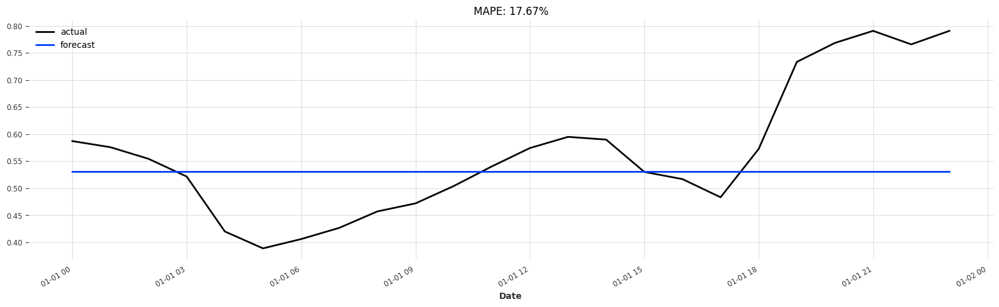

In [41]:
pred_series = my_model.predict(n=24, future_covariates=covariates)
plt.figure(figsize=(20, 5))
plot_val_trans.plot(label="actual")
pred_series.plot(label="forecast")
plt.title("MAPE: {:.2f}%".format(mape(pred_series, val_transformed)))
plt.legend()


In [ ]:
print(pred_series)

In [ ]:
best_model = RNNModel.load_from_checkpoint(model_name="LSTM_Load", best=True)
eval_model(best_model)

In [ ]:
backtest_series = my_model.historical_forecasts(
    series_transformed,
    future_covariates=covariates,
    start=pd.Timestamp("20220101"),
    forecast_horizon=6,
    retrain=False,
    verbose=True,
)